In [ ]:
!pip install xgboost

You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
!pip install lightgbm

You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
!pip install missingno

You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
!pip install shap

You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
!pip install interpret

You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import missingno as meso

import sklearn
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer

from sklearn.model_selection import GridSearchCV, cross_val_score, KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn import svm

import matplotlib as mpl
import matplotlib.pyplot as plt

import xgboost
import lightgbm
import shap
from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use('seaborn-whitegrid')
mpl.rcParams['figure.dpi'] = 300

In [ ]:
seed = 0
np.random.seed(seed)

## 1. EDA

In [ ]:
raw_df = pd.read_csv('Project_B_NHANESI_full.csv')
raw_df.describe()

,sequence_ID,race,poverty_index,age,serum_albumin,alkaline_phosphatase,SGOT,BUN,calcium,creatinine,...,total_iron_binding_capacity,tranferrin_saturation,urine_pH,sedimentation_rate,uric_acid,systolic_blood_pressure,pulse_pressure,weight,height,y
count,14407.000000,14407.000000,11348.000000,14407.000000,10801.000000,6364.000000,6315.000000,2935.000000,6256.00000,2591.000000,...,10149.000000,9932.000000,13695.000000,10308.000000,6651.000000,14339.000000,14335.000000,14338.000000,14361.000000,14407.000000
mean,13109.294093,1.174429,285.288597,48.944888,4.360467,60.204085,2.428643,14.807291,9.67102,1.008066,...,362.766184,28.555910,5.631179,16.182383,5.526643,134.169607,50.667388,70.993984,166.254836,-9.109808
std,7376.747797,0.407539,223.320839,15.589963,0.329382,25.888013,1.489863,4.463475,0.47855,0.284178,...,59.968864,11.232671,0.774016,11.481789,1.470401,24.411942,18.027675,15.751339,9.175197,14.398436
min,1.000000,1.000000,2.000000,25.000000,2.700000,4.800000,0.270000,0.800000,0.20000,0.400000,...,112.000000,3.200000,5.000000,1.000000,0.700000,80.000000,10.000000,27.900000,132.800000,-22.060274
25%,6711.500000,1.000000,129.000000,35.000000,4.200000,45.000000,1.800000,12.000000,9.40000,0.900000,...,322.000000,21.000000,5.000000,7.000000,4.500000,118.000000,38.000000,59.530000,159.500000,-19.885246
50%,13313.000000,1.000000,229.000000,48.000000,4.400000,57.000000,2.200000,14.000000,9.70000,1.000000,...,356.000000,27.200000,5.000000,14.000000,5.400000,130.000000,48.000000,69.170000,165.500000,-18.028288
75%,19835.500000,1.000000,358.000000,65.000000,4.600000,70.000000,2.600000,17.000000,10.00000,1.100000,...,396.000000,34.600000,6.000000,22.000000,6.500000,148.000000,60.000000,80.290000,172.700000,6.179078
max,25061.000000,3.000000,999.000000,75.000000,5.700000,580.000000,31.000000,49.000000,12.50000,9.000000,...,717.000000,100.000000,9.000000,72.000000,12.500000,270.000000,170.000000,181.440000,205.000000,21.474220


Variable categories:

+ Blood test: ['serum_albumin', 'alkaline_phosphatas', 'SGOT', 'BUN', 'calcium', 'potassium', 'sodium', 'total_bilirubin', 'serum_protein', 'red_blood_cells', 'white_blood_cells', 'hemoglobin', 'hematocrit', 'segmented_neutrophi', 'lymphocytes', 'monocytes', 'eosinophils', 'basophils', 'band_neutrophils', 'cholesterol', 'serum_iron', 'serum_magnesium', 'total_iron_binding_capacity', 'tranferrin_saturation']
+ Urine test: ['creatinine', 'urine_pH', 'sedimentation_rate', 'uric_acid']
+ Other: ['poverty_index', 'race', 'age', 'weight', 'height', 'systolic_blood_pressure', 'pulse_pressure']

Variable types:

+ Categorical variables: ['sex_isFemale', 'race', 'platelets_estimate', 'urine_albumin', 'urine_glucose','urine_hematest']
+ Continuous variables: Others


In [ ]:
# prepare for EDA
colcat1 = ['poverty_index', 'race', 'weight', 'height', 'systolic_blood_pressure', 'pulse_pressure'] # "other" 6
colcat2 = ['serum_albumin', 'sodium', 'serum_protein', 'red_blood_cells', 'white_blood_cells', 'hemoglobin'] # "Bloot test" 6
colcat3 = [ 'cholesterol', 'serum_iron', 'serum_magnesium', 'total_iron_binding_capacity', 'tranferrin_saturation', 'hematocrit'] # "blood test" 6
colcat4 = ['urine_pH', 'sedimentation_rate'] # urine test 2
raw_df['Death'] = (raw_df['y'] > 0).astype('int')
raw_df['race'] = raw_df['race'].astype('str')

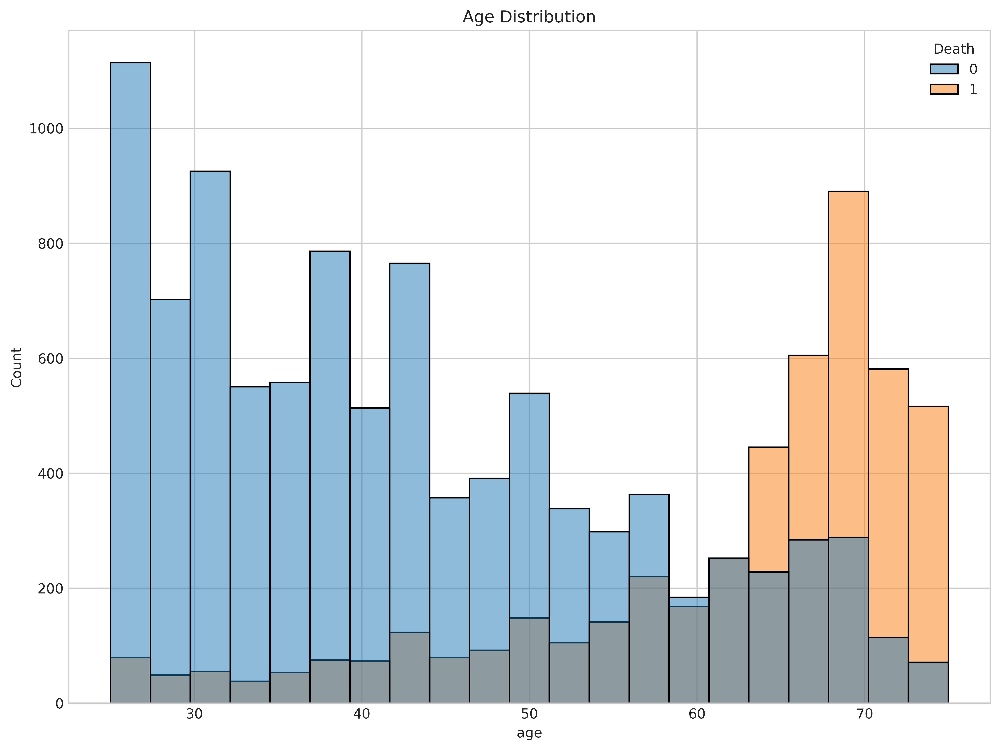

In [ ]:
# Age
fig, axs = plt.subplots(figsize=(12, 9))
sns.histplot(data = raw_df, x = 'age', hue = 'Death', ax = axs)
plt.title("Age Distribution");

In [ ]:
fig, axs = plt.subplots(3, 2, figsize=(15, 30))
axs = axs.ravel()
for i, col_name in enumerate(colcat1):
    if col_name == 'race': # categorical
        percentage = (raw_df.groupby(['Death'])['race']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('race'))
        _ = sns.barplot(x='race', y='percentage', hue='Death', data=percentage, ax = axs[i])
    else:
        _ = sns.kdeplot(data=raw_df, x=col_name, hue = 'Death', common_norm=False, ax=axs[i])

In [ ]:
fig, axs = plt.subplots(3, 2, figsize=(15, 30))
axs = axs.ravel()
for i, col_name in enumerate(colcat2):
    _ = sns.kdeplot(data=raw_df, x=col_name, hue='Death', common_norm=False, ax=axs[i])

In [ ]:
fig, axs = plt.subplots(4, 2, figsize=(15, 30))
axs = axs.ravel()
for i, col_name in enumerate(colcat3+colcat4):
    if col_name == "urine_pH": # categorical
        percentage = (raw_df.groupby(['Death'])['urine_pH']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('urine_pH'))
        _ = sns.barplot(x="urine_pH", y="percentage", hue="Death", data=percentage, ax = axs[i])
    else:
        _ = sns.kdeplot(data=raw_df, x=col_name, hue='Death', common_norm=False, ax=axs[i])

## 2. Visualizing Important Variables

We use random forest to compute variable importance and first do EDA for important variables.

In [ ]:
df = raw_df.copy()
df['sex_isFemale'] = raw_df['sex_isFemale'].astype(int)
columns_cat = ['sex_isFemale', 'race', 'platelets_estimate', 'urine_albumin', 'urine_glucose','urine_hematest']
for col_name in columns_cat:
    df[col_name] = df[col_name].map(lambda x: f'{col_name}_{x}', na_action='ignore')
df = pd.concat([df] + [pd.get_dummies(df[col_name]) for col_name in columns_cat], axis=1)
df = df.drop(columns=columns_cat+['sequence_ID'])

missing_ratio = df.isna().sum(axis=0) / df.shape[0]
dropcol =  df.columns[missing_ratio >= 0.5]
print("Drop columns: ", dropcol)
columns_abun = df.columns[missing_ratio < 0.5]
df_abun = df[columns_abun].dropna()

Drop columns:  Index(['alkaline_phosphatase', 'SGOT', 'BUN', 'calcium', 'creatinine',
       'potassium', 'sodium', 'total_bilirubin', 'segmented_neutrophils',
       'lymphocytes', 'monocytes', 'eosinophils', 'basophils',
       'band_neutrophils', 'uric_acid'],
      dtype='object')


In [ ]:
df_abun.columns

Index(['poverty_index', 'age', 'serum_albumin', 'serum_protein',
       'red_blood_cells', 'white_blood_cells', 'hemoglobin', 'hematocrit',
       'cholesterol', 'serum_iron', 'serum_magnesium',
       'total_iron_binding_capacity', 'tranferrin_saturation', 'urine_pH',
       'sedimentation_rate', 'systolic_blood_pressure', 'pulse_pressure',
       'weight', 'height', 'y', 'Death', 'sex_isFemale_0', 'sex_isFemale_1',
       'race_1', 'race_2', 'race_3', 'platelets_estimate_Decreased',
       'platelets_estimate_Increased', 'platelets_estimate_Normal',
       'urine_albumin_>=100', 'urine_albumin_>=1000', 'urine_albumin_>=30',
       'urine_albumin_>=300', 'urine_albumin_Negative', 'urine_albumin_Trace',
       'urine_glucose_Dark', 'urine_glucose_Light', 'urine_glucose_Medium',
       'urine_glucose_Negative', 'urine_glucose_Trace',
       'urine_glucose_Verydark', 'urine_hematest_Large',
       'urine_hematest_Moderate', 'urine_hematest_Negative',
       'urine_hematest_Small', 'urine

In [ ]:
rf = RandomForestClassifier()
rf.fit(df_abun.drop(columns = ['y','Death']), df_abun['Death'])

RandomForestClassifier()

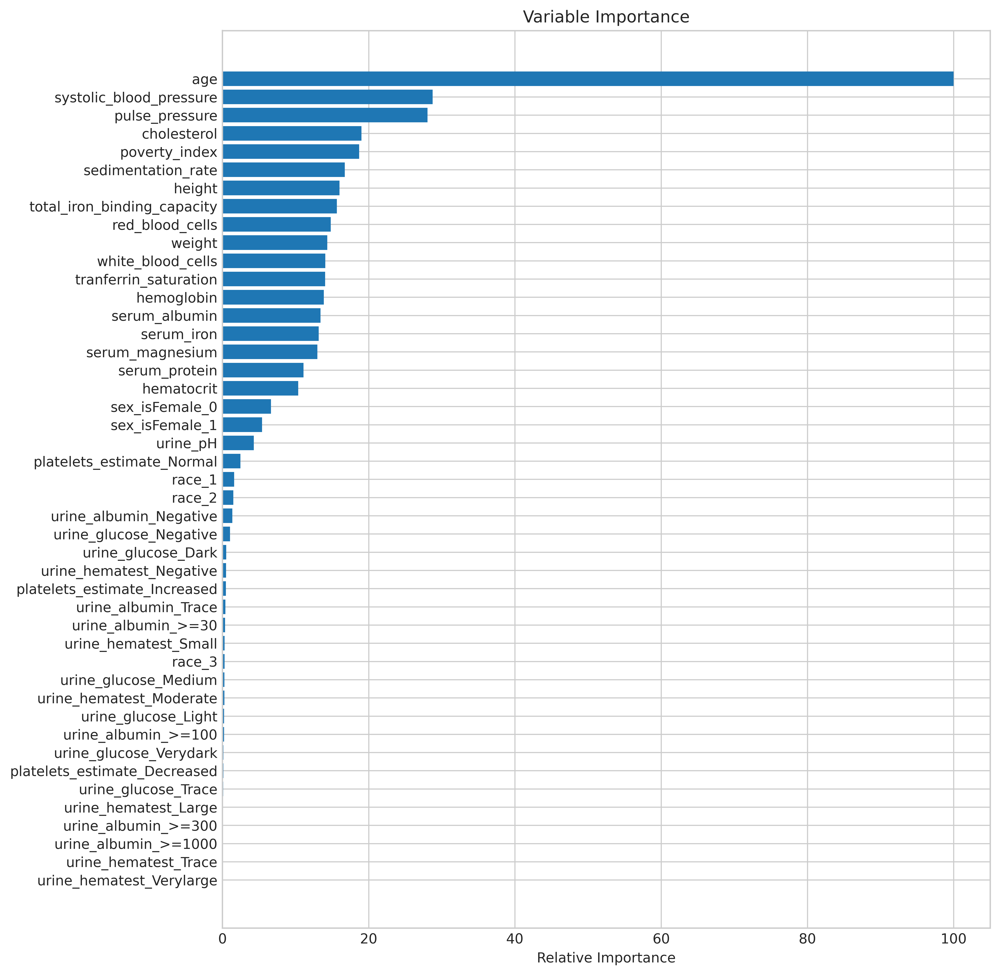

In [ ]:
var_imps = rf.feature_importances_
var_imps = 100.0 * (var_imps / var_imps.max())
sorted_idx = np.argsort(var_imps)
pos = np.arange(sorted_idx.shape[0]) + .5

# Plot
plt.figure(figsize=(10, 12))
plt.barh(pos, var_imps[sorted_idx], align='center')
plt.yticks(pos, df_abun.drop(columns=['y', 'Death']).columns[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show();

In [ ]:
columns_imp = df_abun.drop(columns=['y', 'Death']).columns[var_imps > 2]
columns_imp

Index(['poverty_index', 'age', 'serum_albumin', 'serum_protein',
       'red_blood_cells', 'white_blood_cells', 'hemoglobin', 'hematocrit',
       'cholesterol', 'serum_iron', 'serum_magnesium',
       'total_iron_binding_capacity', 'tranferrin_saturation', 'urine_pH',
       'sedimentation_rate', 'systolic_blood_pressure', 'pulse_pressure',
       'weight', 'height', 'sex_isFemale_0', 'sex_isFemale_1',
       'platelets_estimate_Normal'],
      dtype='object')

In [ ]:
raw_df['Death'] = (raw_df['y'] > 0).astype('int')

fig, axs = plt.subplots(4, 3, figsize=(15, 15))
for i, col_name in enumerate(columns_imp[:12]):
    _ = sns.kdeplot(data=raw_df, x=col_name, hue='Death', common_norm=False, ax=axs[i//3, i%3])

## 3. Data Preprocessing

### Missing Data Visualization

We find lots of missing data in the data set. Some of columns are missing over 80%. 

In [ ]:
meso.matrix(raw_df);

### Removing Columns with >50% Missing Values

In [ ]:
df = raw_df.copy()
df.head();
Y = df['Death'].copy()
X = df.drop(columns = ['Death', 'y','sequence_ID'])

# drop columns with missing ratio > 0.5
missing_ratio = X.isna().sum(axis=0) / X.shape[0]
dropcol =  X.columns[missing_ratio >= 0.5]
print("Drop columns: ", dropcol)
columns_abun = X.columns[missing_ratio < 0.5]
X_abun = X[columns_abun]

Drop columns:  Index(['alkaline_phosphatase', 'SGOT', 'BUN', 'calcium', 'creatinine',
       'potassium', 'sodium', 'total_bilirubin', 'platelets_estimate',
       'segmented_neutrophils', 'lymphocytes', 'monocytes', 'eosinophils',
       'basophils', 'band_neutrophils', 'uric_acid'],
      dtype='object')


### Imputing Numerical Variables and Transforming Categorical Variables to One-Hot Encoding

Since the missing data are missing at random, we decide to do imputation. In the following pipeline, we impute missing values by iterative imputer and transformed categorical variables to dummy variables.

In [ ]:
# categorical cols and numerical data
columns_cat = ['sex_isFemale', 'race', 'urine_albumin', 'urine_glucose','urine_hematest']
X_numeric = X_abun.drop(columns=columns_cat)

# pipeline
numeric_transfs = [('imputer', IterativeImputer(imputation_order='ascending', max_iter=50, random_state=seed))]
numeric_pipeline = Pipeline(numeric_transfs)
numeric_attr = list(X_numeric)

# pipeline
categoric_attr = columns_cat

# full pipeline
all_transfs = [('numeric', numeric_pipeline, numeric_attr), ('categorical', OneHotEncoder(), categoric_attr)]
full_pipeline = ColumnTransformer(all_transfs, remainder='passthrough')

X_transformed = full_pipeline.fit_transform(X_abun)

In [ ]:
X_numeric_names = X_numeric.columns.to_list()
X_cat_name = list(full_pipeline.transformers_[1][1].get_feature_names_out(columns_cat))
column_names = X_numeric_names + X_cat_name
X_transformed = pd.DataFrame(X_transformed, columns=column_names)

## 4. Baseline Model Without Hyperparameter Tuning

We use 5-fold cross validation to estimate the generalization error of the default SVM classifier.

### SVM Classifier

In [ ]:
svm_clf = svm.SVC(random_state=seed)
svm_scores = cross_val_score(svm_clf, X_transformed, Y, cv=5)

In [ ]:
print(f'The mean 10-fold CV classification accuracy of untuned SVM is {svm_scores.mean():.4f}')

The mean 10-fold CV classification accuracy of untuned SVM is 0.8112


## 5. Selecting the Best Model With Hyperparameter Tuning

We use nested cross validation to evaluate how well a model applies to our data.

### Random Forest Classifier

In [ ]:
param_grid = {
    'max_depth': [10, 50],
    'n_estimators': [50, 100, 200]
}

rf = RandomForestClassifier()

# Nested CV with parameter optimization
inner_cv = KFold(n_splits=3, shuffle=True, random_state=seed)
outer_cv = KFold(n_splits=3, shuffle=True, random_state=seed)

clf = GridSearchCV(estimator=rf, param_grid=param_grid, cv=inner_cv)
nested_score = cross_val_score(clf, X=X_transformed, y=Y, cv=outer_cv)
nested_score.mean()

0.8252236984907709

### XGBoost

In [ ]:
param_grid = {
    'max_depth': [5, 10, 20],
    'n_estimators': [50, 100, 200]
}

xgb_clf = xgboost.XGBClassifier()

# Nested CV with parameter optimization
inner_cv = KFold(n_splits=3, shuffle=True, random_state=seed)
outer_cv = KFold(n_splits=3, shuffle=True, random_state=seed)

clf = GridSearchCV(estimator=xgb_clf, param_grid=param_grid, cv=inner_cv)
nested_score = cross_val_score(clf, X=X_transformed, y=Y, cv=outer_cv)
nested_score.mean()

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
[03:57:32] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
[03:57:40] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objecti

0.8200180402311723

Comparing these two scores, XGBoost is slightly better than random forest.

### LightGBM

In [ ]:
param_grid = {
    'max_depth': [5, 10, 20],
    'n_estimators': [50, 100, 200]
}

lgbm_clf = lightgbm.LGBMClassifier(random_state=seed)

# Nested CV with parameter optimization
inner_cv = KFold(n_splits=3, shuffle=True, random_state=seed)
outer_cv = KFold(n_splits=3, shuffle=True, random_state=seed)

clf = GridSearchCV(estimator=lgbm_clf, param_grid=param_grid, cv=inner_cv)
nested_score = cross_val_score(clf, X=X_transformed, y=Y, cv=outer_cv)
nested_score.mean()

NameError: name 'lightgbm' is not defined

0.8232805263751666

## 6. Interpretability Methods

### XGBoost with SHAP Interpretation

In [ ]:
xgb_clf = xgboost.XGBClassifier().fit(X_transformed, Y)
explainer = shap.TreeExplainer(xgb_clf)
shap_values = explainer(X_transformed)

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
[05:05:06] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
ntree_limit is deprecated, use `iteration_range` or model slicing instead.


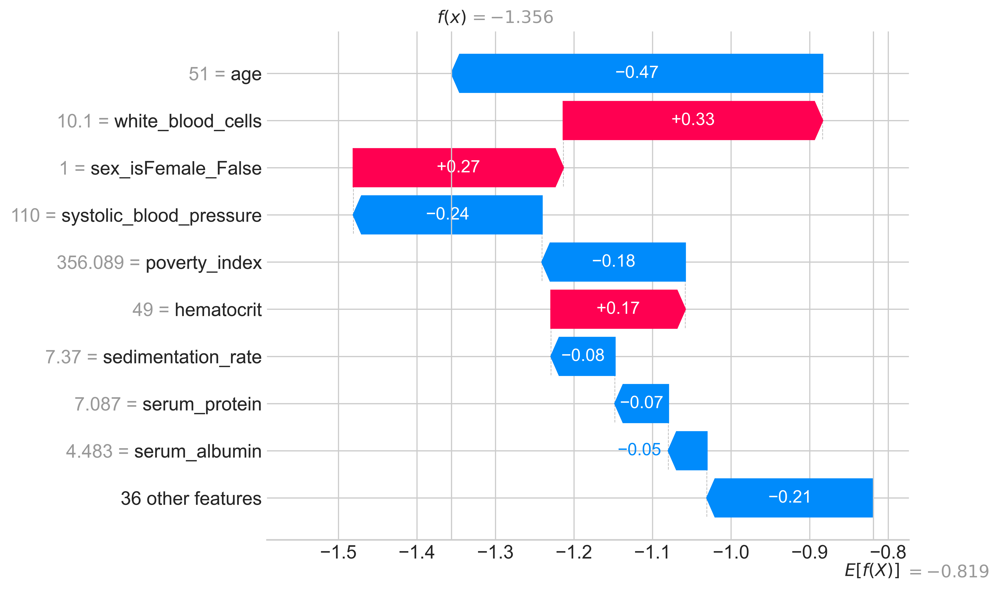

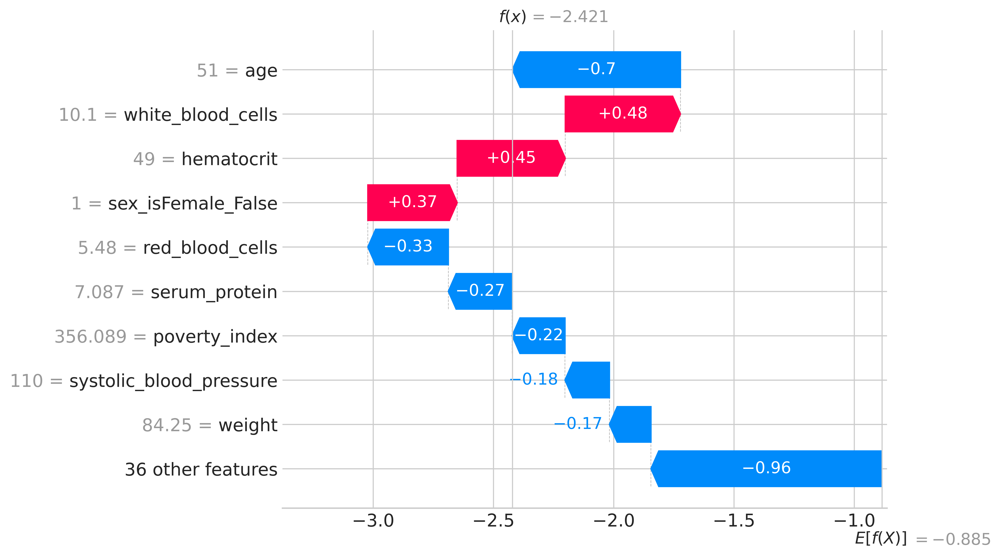

In [ ]:
# Visualize the first prediction's explanation
shap.plots.waterfall(shap_values[0])

In [ ]:
# Visualize the summary of shap values
shap.summary_plot(shap_values, X_transformed)

### Explainable Boosting Machine

In [ ]:
ebm = ExplainableBoostingClassifier(random_state=seed)
ebm.fit(X_transformed, Y)

ebm_global = ebm.explain_global()
show(ebm_global)

ExplainableBoostingClassifier(feature_names=['poverty_index', 'age',
                                             'serum_albumin', 'serum_protein',
                                             'red_blood_cells',
                                             'white_blood_cells', 'hemoglobin',
                                             'hematocrit', 'cholesterol',
                                             'serum_iron', 'serum_magnesium',
                                             'total_iron_binding_capacity',
                                             'tranferrin_saturation',
                                             'urine_pH', 'sedimentation_rate',
                                             'systolic_blood_pressure',
                                             'pulse_pressure', 'weight',
                                             'hei...
                                             'continuous', 'continuous',
                                             'continuous', '

<!-- http://127.0.0.1:7001/140364153936336/ -->


The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`

The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`

The dash_table package is deprecated. Please replace
`import dash_table` with `from dash import dash_table`

Also, if you're using any of the table format helpers (e.g. Group), replace 
`from dash_table.Format import Group` with 
`from dash.dash_table.Format import Group`



The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`

The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`

The dash_table package is deprecated. Please replace
`import dash_table` with `from dash import dash_table`

Also, if you're using any of the table format helpers (e.g. Group), replace 
`from dash_table.Format import Group` with 
`from dash.dash_table.Format import Group`


<!-- http://127.0.0.1:7001/140488313011856/ -->

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=56b6b4b2-338e-4b89-bf56-59dffb0b470b' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>